# Improved Empty Shelf Detection - Dataset 2

This notebook demonstrates training an improved empty shelf detection model on the empty_shelves2 dataset with:
1. Larger model architecture (YOLOv8m)
2. Advanced data augmentation
3. Hyperparameter optimization
4. Test-time augmentation (TTA)
5. Ensemble methods
6. Comprehensive evaluation

In [1]:
# Import libraries
import os
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2
from pathlib import Path
import random

# Import utility modules
from model_utils import load_model, create_improved_model, train_improved_model_fixed, plot_training_metrics
from augmentation_utils import generate_augmentation_examples
from evaluation_utils import evaluate_model, evaluate_with_tta, compare_models, visualize_predictions
from ensemble_utils import create_ensemble, evaluate_ensemble, visualize_ensemble_predictions

In [2]:
# Set paths and configuration
BASE_DIR = "/home/yannick/tf-nn/PERSONAL"
DATA_YAML_PATH = f"{BASE_DIR}/data/empty_shelves2/data.yaml"
ORIGINAL_MODEL_PATH = f"{BASE_DIR}/runs/detect/yolov8m_improved_empty_shelf/weights/best.pt"
OUTPUT_DIR = f"{BASE_DIR}/improved_model_evaluation_dataset2"
IMPROVED_MODEL_NAME = "yolov8m_improved_empty_shelf_dataset2"

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Configuration settings
CONFIG = {
    'base_model': 'yolov8m.pt',
    'epochs': 100,
    'batch_size': 16,
    'image_size': 832,
    'optimizer': 'AdamW',
    'initial_lr': 0.001,
    'final_lr': 0.0001,
    'weight_decay': 0.0005,
    'conf_threshold': 0.25,
    'iou_threshold': 0.65,
    'model_name': IMPROVED_MODEL_NAME
}

## 1. Analyze Dataset Structure

In [3]:
# Load and analyze the dataset configuration
with open(DATA_YAML_PATH, 'r') as f:
    data_config = yaml.safe_load(f)

print(f"Dataset configuration loaded from {DATA_YAML_PATH}")
print(f"Number of classes: {data_config['nc']}")
print(f"Class names: {data_config['names']}")
print(f"Train path: {data_config['train']}")
print(f"Validation path: {data_config['val']}")
print(f"Test path: {data_config['test']}")

Dataset configuration loaded from /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/data.yaml
Number of classes: 2
Class names: ['100% O.O.S', '100- O.O.S']
Train path: ../train/images
Validation path: ../valid/images
Test path: ../test/images


Training images: 339
Validation images: 55
Test images: 30
Total images: 424


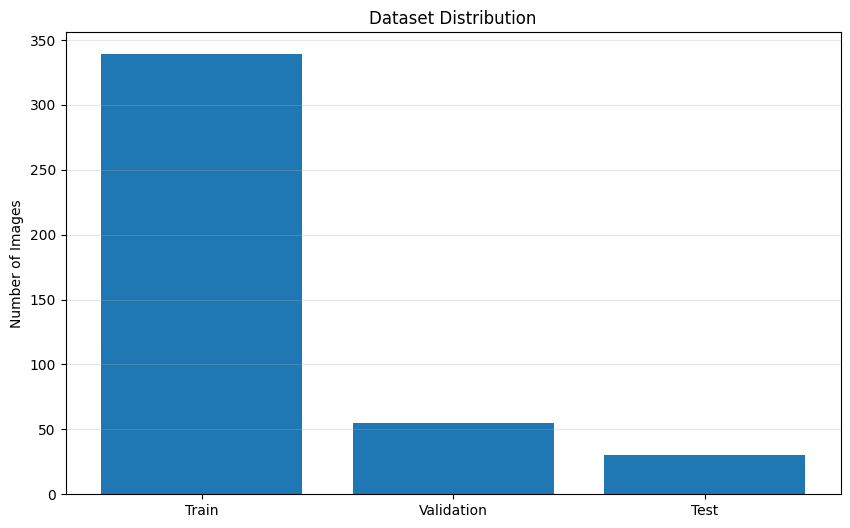

In [4]:
# Count images in each split
def count_images(path):
    full_path = os.path.join(BASE_DIR, 'data/empty_shelves2', path.replace('../', ''))
    return len([f for f in os.listdir(full_path) if f.endswith(('.jpg', '.jpeg', '.png'))])

train_count = count_images(data_config['train'])
val_count = count_images(data_config['val'])
test_count = count_images(data_config['test'])

print(f"Training images: {train_count}")
print(f"Validation images: {val_count}")
print(f"Test images: {test_count}")
print(f"Total images: {train_count + val_count + test_count}")

# Visualize dataset distribution
plt.figure(figsize=(10, 6))
plt.bar(['Train', 'Validation', 'Test'], [train_count, val_count, test_count])
plt.title('Dataset Distribution')
plt.ylabel('Number of Images')
plt.grid(axis='y', alpha=0.3)
plt.show()

## 2. Load Improved Model

In [5]:
# Load the improved model from the previous training
try:
    improved_model = load_model(ORIGINAL_MODEL_PATH)
    print(f"Loaded improved model from {ORIGINAL_MODEL_PATH}")
except Exception as e:
    print(f"Could not load improved model: {e}")
    print("Creating new model from pretrained weights...")
    improved_model = YOLO(CONFIG['base_model'])
    print(f"Created new model from {CONFIG['base_model']}")

Model loaded from: /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf/weights/best.pt
Loaded improved model from /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf/weights/best.pt


## 3. Generate Augmentation Examples

Advanced augmentation examples saved to /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/augmentation_examples.png/augmentation_examples.png
Advanced augmentation examples saved to /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/augmentation_examples.png
Could not generate augmentation examples: [Errno 21] Is a directory: '/home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/augmentation_examples.png'


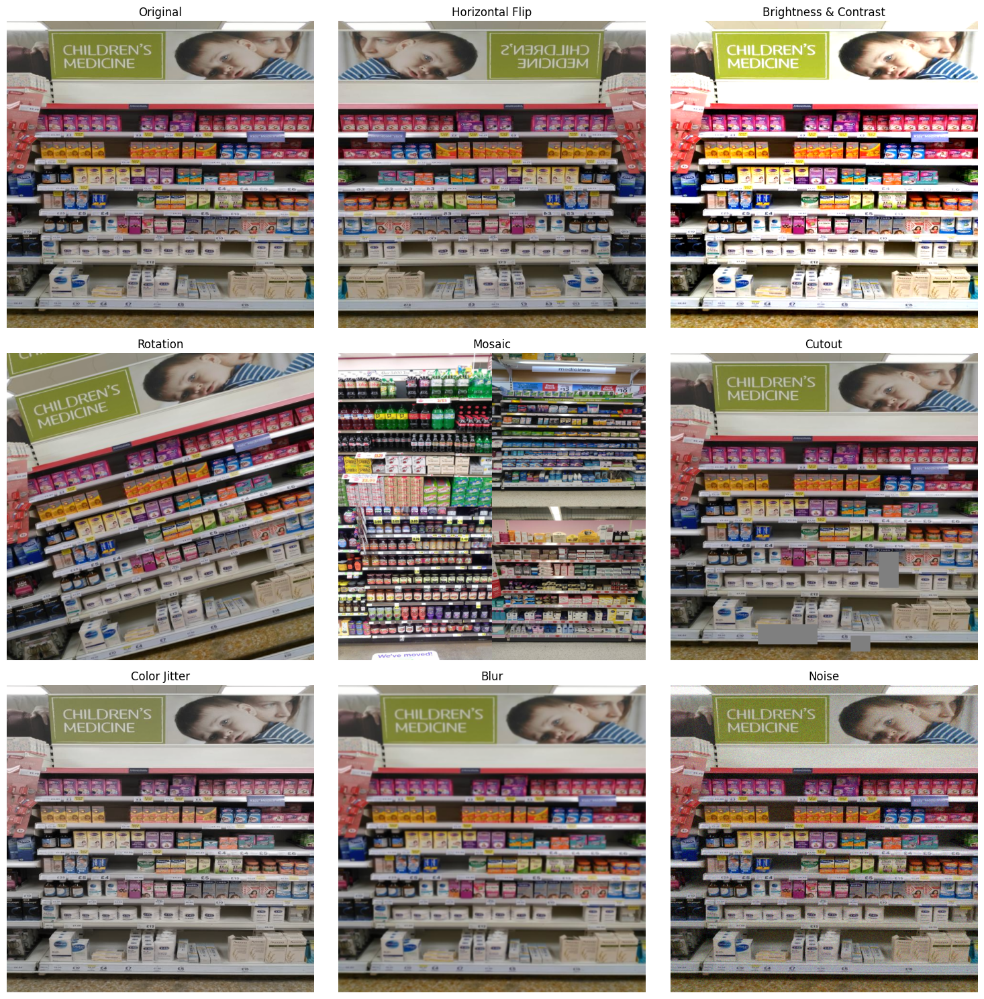

In [6]:
# Generate examples of augmented images
try:
    augmentation_examples_path = os.path.join(OUTPUT_DIR, 'augmentation_examples.png')
    generate_augmentation_examples(DATA_YAML_PATH, augmentation_examples_path)
    print(f"Advanced augmentation examples saved to {augmentation_examples_path}")
    
    # Display the augmentation examples
    from IPython.display import Image, display
    display(Image(filename=augmentation_examples_path))
except Exception as e:
    print(f"Could not generate augmentation examples: {e}")

## 4. Train Improved Model on Dataset 2

In [7]:
# Create a new improved model for training on dataset 2
model_dataset2 = create_improved_model(CONFIG['base_model'])  # Pass just the base_model string
print(f"Created new model for dataset 2 training: {CONFIG['model_name']}")

Created improved model based on yolov8m.pt
Created new model for dataset 2 training: yolov8m_improved_empty_shelf_dataset2


In [8]:
# Train the model on dataset 2
results = train_improved_model_fixed(
    base_model=model_dataset2,  # Changed from model= to base_model=
    data_yaml_path=DATA_YAML_PATH,
    epochs=CONFIG['epochs'],
    batch_size=CONFIG['batch_size'],
    image_size=CONFIG['image_size'],
    optimizer=CONFIG['optimizer'],
    initial_lr=CONFIG['initial_lr'],
    final_lr=CONFIG['final_lr'],
    weight_decay=CONFIG['weight_decay'],
    model_name=CONFIG['model_name']
)

print(f"Training completed. Results saved to {results}")

New https://pypi.org/project/ultralytics/8.3.157 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.129 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=0.05, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.3, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/home/yannick/tf-nn/PERSONAL/data/empty_shelves2/data.yaml, degrees=10.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=832, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.0001, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, na

train: Scanning /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/train/labels... 339 images, 9 backgrounds, 0 corrupt: 100%|██████████| 339/339 [00:00<00:00, 603.35it/s]

train: New cache created: /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 116.3±68.0 MB/s, size: 91.4 KB)


val: Scanning /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/labels... 55 images, 14 backgrounds, 0 corrupt: 100%|██████████| 55/55 [00:00<00:00, 405.26it/s]

val: New cache created: /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/labels.cache


Plotting labels to runs/detect/yolov8m_improved_empty_shelf_dataset2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 832 train, 832 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8m_improved_empty_shelf_dataset2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      9.96G     0.0143      1.881      1.844         36        832: 100%|██████████| 22/22 [06:49<00:00, 18.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [02:37<00:00, 78.57s/it] 

                   all         55        202      0.296      0.376      0.243     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.3G    0.01126      1.256      1.447         29        832: 100%|██████████| 22/22 [00:12<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]

                   all         55        202      0.188       0.47       0.28      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.4G    0.01101      1.142      1.432         12        832: 100%|██████████| 22/22 [00:09<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]

                   all         55        202      0.309      0.624      0.408      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.4G    0.01053      1.081       1.37         22        832: 100%|██████████| 22/22 [00:09<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all         55        202      0.324      0.624      0.447      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.4G    0.01061      1.043       1.38         22        832: 100%|██████████| 22/22 [00:08<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         55        202      0.601       0.49      0.488      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.5G    0.01033      1.018      1.356         28        832: 100%|██████████| 22/22 [00:07<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]

                   all         55        202      0.647      0.624      0.597      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.3G     0.0106      1.028        1.4         18        832: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all         55        202      0.548      0.528      0.467      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.4G    0.01027       1.01      1.354         40        832: 100%|██████████| 22/22 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         55        202      0.423      0.619      0.471      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.1G    0.01023     0.9584      1.364         36        832: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all         55        202      0.474      0.505      0.483      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.2G    0.01013     0.9837      1.355          6        832: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         55        202      0.395      0.579      0.399      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.3G   0.009993     0.9352      1.341         21        832: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all         55        202      0.503      0.465      0.409      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.4G    0.01007     0.9261      1.336         56        832: 100%|██████████| 22/22 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.29s/it]

                   all         55        202      0.588      0.505       0.53      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.3G   0.009811     0.8712      1.316         36        832: 100%|██████████| 22/22 [00:08<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.03it/s]

                   all         55        202      0.651      0.722      0.693      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.4G    0.01006      0.934      1.348         45        832: 100%|██████████| 22/22 [00:09<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         55        202      0.671      0.644      0.641      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.4G   0.009566     0.8469      1.287         54        832: 100%|██████████| 22/22 [00:07<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all         55        202      0.654      0.767      0.724      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.4G   0.009625     0.8461      1.297         27        832: 100%|██████████| 22/22 [00:09<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]

                   all         55        202      0.748      0.661      0.737      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.4G   0.009748     0.8729      1.313         30        832: 100%|██████████| 22/22 [00:09<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         55        202      0.689      0.609      0.666      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.4G   0.009743     0.8482      1.314         36        832: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         55        202      0.738      0.639      0.676      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.3G   0.009348      0.817      1.284         46        832: 100%|██████████| 22/22 [00:09<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         55        202      0.528       0.52      0.516      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.4G   0.009468     0.8216      1.291         36        832: 100%|██████████| 22/22 [00:07<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         55        202      0.735      0.713      0.734      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.1G   0.009273     0.8267      1.266         24        832: 100%|██████████| 22/22 [00:09<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         55        202      0.766      0.698      0.744      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.4G   0.009445     0.8203      1.288         30        832: 100%|██████████| 22/22 [00:07<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         55        202      0.694      0.624      0.689      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.4G   0.009143     0.8059      1.259         38        832: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all         55        202      0.714       0.68      0.697      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.4G   0.009144     0.7903      1.285         34        832: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:17<00:00,  8.74s/it]

                   all         55        202        0.7      0.683      0.733      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.4G    0.00894     0.7639      1.249         35        832: 100%|██████████| 22/22 [00:11<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.38it/s]

                   all         55        202      0.658      0.757      0.742      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.4G   0.008683     0.7518      1.241         23        832: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         55        202      0.722      0.723      0.742      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.2G   0.009118     0.8169      1.269         30        832: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         55        202       0.73      0.723      0.753      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.3G   0.009044     0.7753      1.258         27        832: 100%|██████████| 22/22 [00:07<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         55        202      0.769      0.703      0.759      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.3G   0.008989     0.7563      1.262         29        832: 100%|██████████| 22/22 [00:09<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         55        202      0.822      0.792      0.845      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.4G    0.00871     0.7582      1.249         20        832: 100%|██████████| 22/22 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         55        202      0.828      0.738      0.805      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.4G   0.008633     0.7338      1.225         53        832: 100%|██████████| 22/22 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all         55        202      0.719      0.728      0.699      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.3G   0.008736     0.7405      1.215         39        832: 100%|██████████| 22/22 [00:09<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all         55        202      0.673      0.643      0.665      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.3G   0.008723     0.7451      1.246         17        832: 100%|██████████| 22/22 [00:07<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.84s/it]

                   all         55        202      0.755      0.703      0.736      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.4G     0.0088     0.7372      1.245         21        832: 100%|██████████| 22/22 [00:11<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:18<00:00,  9.22s/it]

                   all         55        202      0.795      0.738      0.771       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.3G   0.008387     0.7081      1.207         26        832: 100%|██████████| 22/22 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

                   all         55        202      0.786      0.688      0.717      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.2G   0.008605     0.7231      1.248         26        832: 100%|██████████| 22/22 [00:12<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         55        202      0.688      0.741      0.771      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.4G   0.008229     0.7003      1.213         16        832: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         55        202       0.73      0.762      0.778      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.4G   0.008488     0.7107      1.229         38        832: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all         55        202      0.812       0.79      0.849      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.3G   0.008136     0.6617      1.194         37        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         55        202      0.805      0.762      0.815      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.3G   0.008363      0.702      1.217         34        832: 100%|██████████| 22/22 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all         55        202      0.725      0.703      0.737      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.3G   0.008325     0.7026      1.214         46        832: 100%|██████████| 22/22 [00:10<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all         55        202      0.728      0.713      0.761      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.4G   0.008403     0.6961      1.208         39        832: 100%|██████████| 22/22 [00:07<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]

                   all         55        202      0.743      0.688      0.757      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.2G   0.007754     0.6353       1.16         31        832: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all         55        202      0.738      0.668       0.77      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.4G   0.007817     0.6333      1.174         19        832: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.18s/it]

                   all         55        202      0.653      0.688      0.716      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.2G   0.008044     0.6535      1.192         40        832: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:17<00:00,  8.86s/it]

                   all         55        202       0.83      0.757      0.854      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.4G   0.007855     0.6365      1.163         22        832: 100%|██████████| 22/22 [00:17<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]

                   all         55        202      0.773      0.639      0.737      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.2G   0.007794     0.6369       1.16         48        832: 100%|██████████| 22/22 [00:07<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all         55        202      0.685      0.673      0.721      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.4G   0.007574     0.6132      1.158         43        832: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]

                   all         55        202      0.791      0.824      0.864      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.1G   0.007871     0.6371      1.162         57        832: 100%|██████████| 22/22 [00:08<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         55        202      0.829      0.757      0.838      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.4G   0.007561     0.6283      1.151         43        832: 100%|██████████| 22/22 [00:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]

                   all         55        202      0.748        0.5      0.633      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.3G   0.007903     0.6423      1.181         38        832: 100%|██████████| 22/22 [00:09<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         55        202      0.772      0.465      0.598        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.4G    0.00758     0.5879      1.144         30        832: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         55        202       0.76      0.663      0.783      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.3G   0.006936     0.5291      1.088         25        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:56<00:00, 28.34s/it]

                   all         55        202        0.8      0.711      0.813      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.4G   0.007569     0.5826      1.135         27        832: 100%|██████████| 22/22 [00:30<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.60s/it]

                   all         55        202      0.805      0.713      0.829      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.2G   0.007062     0.5512      1.114         24        832: 100%|██████████| 22/22 [00:07<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         55        202      0.773      0.759      0.825      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.4G   0.007398     0.5828      1.129         32        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all         55        202      0.787      0.728      0.827      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.4G    0.00742     0.5722      1.145         27        832: 100%|██████████| 22/22 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.80s/it]

                   all         55        202      0.805      0.772      0.847      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.4G   0.007579     0.5953      1.155         14        832: 100%|██████████| 22/22 [00:13<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all         55        202      0.692      0.578      0.702      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.4G   0.007221     0.5591      1.113         35        832: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all         55        202      0.785      0.678      0.774      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.4G   0.007271     0.5835      1.145         22        832: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         55        202       0.86      0.639      0.818      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.3G   0.007381     0.5549      1.123         22        832: 100%|██████████| 22/22 [00:07<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         55        202      0.872      0.634      0.814      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.4G   0.007169      0.537      1.099         29        832: 100%|██████████| 22/22 [00:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]

                   all         55        202      0.752      0.767      0.833      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.3G   0.007075     0.5292        1.1         25        832: 100%|██████████| 22/22 [00:07<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all         55        202      0.772      0.723      0.831      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.4G   0.007467     0.5713      1.138         33        832: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all         55        202      0.827      0.703      0.833      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      9.88G   0.006897     0.5266      1.078         21        832: 100%|██████████| 22/22 [00:09<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         55        202      0.806      0.699      0.822      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.5G   0.007044     0.5385      1.116         18        832: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<00:00, 11.09s/it]

                   all         55        202      0.798      0.704      0.816      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.3G   0.007241     0.5398      1.121         23        832: 100%|██████████| 22/22 [00:15<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.95s/it]

                   all         55        202      0.855      0.688      0.824      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.4G   0.006888     0.5137      1.091         18        832: 100%|██████████| 22/22 [00:12<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]

                   all         55        202      0.839      0.643      0.797       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.3G   0.006832      0.501      1.076         32        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]

                   all         55        202       0.81      0.688      0.818      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.4G    0.00701     0.5204      1.086         51        832: 100%|██████████| 22/22 [00:07<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]

                   all         55        202      0.845      0.702      0.848      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.1G   0.006757     0.4886      1.068         23        832: 100%|██████████| 22/22 [00:09<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         55        202      0.767      0.718       0.83       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      10.4G   0.006902     0.5131      1.092         41        832: 100%|██████████| 22/22 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all         55        202      0.781      0.723      0.823      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.2G   0.006574      0.475      1.075         53        832: 100%|██████████| 22/22 [00:09<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         55        202       0.81      0.694      0.814      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.4G   0.006448     0.4492      1.059         52        832: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]

                   all         55        202      0.881      0.624      0.793      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.3G   0.006824     0.4967       1.09         33        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all         55        202       0.81      0.683      0.789      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.5G   0.006808     0.4849      1.067         32        832: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.10s/it]

                   all         55        202      0.839      0.688      0.827      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.3G   0.006627      0.501      1.079         31        832: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<00:00, 12.63s/it]

                   all         55        202      0.787      0.713      0.826      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.4G   0.006887     0.5183      1.095         27        832: 100%|██████████| 22/22 [00:16<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         55        202      0.828      0.663      0.781        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      10.4G   0.006497     0.4651      1.062         47        832: 100%|██████████| 22/22 [00:07<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         55        202      0.813      0.683      0.798      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.4G   0.006528      0.463      1.061         44        832: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         55        202      0.839       0.72      0.821      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.3G   0.006725     0.4891      1.079         26        832: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         55        202      0.803      0.683      0.798      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.4G   0.006396      0.476      1.062          9        832: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all         55        202      0.814      0.693      0.816      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.3G   0.006366     0.4813      1.068         29        832: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all         55        202      0.823      0.713      0.831       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      10.5G   0.006336     0.4404      1.042         35        832: 100%|██████████| 22/22 [00:07<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         55        202      0.873      0.712      0.834      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.3G   0.006467     0.4569      1.055         27        832: 100%|██████████| 22/22 [00:09<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.07s/it]

                   all         55        202      0.838      0.719      0.828      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.2G   0.006354      0.447      1.049         12        832: 100%|██████████| 22/22 [00:10<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]

                   all         55        202      0.833      0.716      0.822      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.2G   0.006219     0.4397      1.046         15        832: 100%|██████████| 22/22 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]

                   all         55        202      0.825      0.723      0.823      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.3G   0.006275     0.4366      1.031         25        832: 100%|██████████| 22/22 [00:08<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         55        202      0.826       0.73      0.844      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.4G   0.006425     0.4731       1.06         26        832: 100%|██████████| 22/22 [00:08<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]

                   all         55        202       0.81      0.741      0.838      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.4G   0.006241     0.4246      1.035         35        832: 100%|██████████| 22/22 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         55        202      0.829      0.718      0.827      0.487


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.2G   0.005442     0.3412      1.006         23        832: 100%|██████████| 22/22 [00:07<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all         55        202      0.865      0.683      0.797      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.3G   0.005375      0.327     0.9959         32        832: 100%|██████████| 22/22 [00:09<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]

                   all         55        202      0.849      0.673      0.775      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.1G   0.005135     0.3059     0.9743         18        832: 100%|██████████| 22/22 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         55        202      0.857      0.668      0.765      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.4G   0.005167     0.3041     0.9884         12        832: 100%|██████████| 22/22 [00:09<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]

                   all         55        202      0.874      0.655      0.755      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.2G   0.005225      0.309     0.9861         14        832: 100%|██████████| 22/22 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.80s/it]

                   all         55        202      0.886      0.653      0.758      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.3G   0.005094     0.3084     0.9781         14        832: 100%|██████████| 22/22 [00:11<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all         55        202      0.875       0.66      0.759      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.2G     0.0051     0.2999     0.9641         22        832: 100%|██████████| 22/22 [00:09<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all         55        202      0.867      0.663       0.76      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      10.3G   0.005057     0.2965     0.9796         12        832: 100%|██████████| 22/22 [00:07<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         55        202      0.868      0.668      0.761      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.2G   0.005024     0.3035     0.9744         23        832: 100%|██████████| 22/22 [00:09<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         55        202      0.868      0.668      0.762      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.3G   0.005125      0.301     0.9753         15        832: 100%|██████████| 22/22 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]

                   all         55        202       0.86      0.668      0.759      0.445



100 epochs completed in 0.584 hours.
Optimizer stripped from runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/last.pt, 52.1MB
Optimizer stripped from runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt, 52.1MB

Validating runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]


                   all         55        202      0.863      0.717      0.846      0.523
            100- O.O.S         41        202      0.863      0.717      0.846      0.523
Speed: 0.3ms preprocess, 19.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/yolov8m_improved_empty_shelf_dataset2

Training completed in 0h 35m 21s
Best model saved to: /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt
Training completed. Results saved to /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt


In [9]:
# Plot training metrics
try:
    metrics_path = os.path.join(OUTPUT_DIR, 'training_metrics.png')
    plot_training_metrics(results, metrics_path)
    print(f"Training metrics plotted and saved to {metrics_path}")
    
    # Display the metrics plot
    from IPython.display import Image, display
    display(Image(filename=metrics_path))
except Exception as e:
    print(f"Could not plot training metrics: {e}")

Could not plot training metrics: 'utf-8' codec can't decode byte 0x80 in position 64: invalid start byte


## 5. Model Evaluation

In [62]:
# Load the best model from training
best_model_path = f"{BASE_DIR}/runs/detect/{CONFIG['model_name']}/weights/best.pt"
best_model = load_model(best_model_path)
print(f"Loaded best model from {best_model_path}")

Model loaded from: /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt
Loaded best model from /home/yannick/tf-nn/PERSONAL/runs/detect/yolov8m_improved_empty_shelf_dataset2/weights/best.pt


In [63]:
# Reload the module to get the updated function
import importlib
import evaluation_utils
importlib.reload(evaluation_utils)

# Re-import the function to ensure you get the updated version
from evaluation_utils import compare_models

print("✅ Successfully reloaded the evaluation_utils module with the fixed functions!")

✅ Successfully reloaded the evaluation_utils module with the fixed functions!


In [64]:
# Evaluate the model on the test set
evaluation_results = evaluate_model(
    model=best_model,
    data_yaml_path=DATA_YAML_PATH,
    conf_threshold=CONFIG['conf_threshold'],
    iou_threshold=CONFIG['iou_threshold'],
    output_dir=os.path.join(OUTPUT_DIR, 'standard_evaluation')
)

print("Standard Evaluation Results:")
print(f"Precision: {evaluation_results['metrics']['precision']:.4f}")
print(f"Recall: {evaluation_results['metrics']['recall']:.4f}")
print(f"F1-Score: {evaluation_results['metrics']['f1']:.4f}")
print(f"mAP50: {evaluation_results['metrics']['map50']:.4f}")
print(f"mAP50-95: {evaluation_results['metrics']['map']:.4f}")

Evaluating model on val set...
Ultralytics 8.3.129 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1844.1±880.3 MB/s, size: 90.3 KB)


val: Scanning /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/labels.cache... 55 images, 14 backgrounds, 0 corrupt: 100%|██████████| 55/55 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]


                   all         55        202       0.87      0.693      0.815      0.522
            100- O.O.S         41        202       0.87      0.693      0.815      0.522
Speed: 4.7ms preprocess, 13.1ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/detect/val29

Evaluation Results (val set):
mAP@0.5: 0.8148
mAP@0.5:0.95: 0.5221
Precision: 0.8696
Recall: 0.6931
F1-Score: 0.7713
Standard Evaluation Results:
Precision: 0.8696
Recall: 0.6931
F1-Score: 0.7713
mAP50: 0.8148
mAP50-95: 0.5221


## 6. Test-Time Augmentation (TTA)

In [65]:
# Evaluate with Test-Time Augmentation
tta_results = evaluate_with_tta(
    model=best_model,
    data_yaml_path=DATA_YAML_PATH,
    conf_threshold=CONFIG['conf_threshold'],
    iou_threshold=CONFIG['iou_threshold'],
    output_dir=os.path.join(OUTPUT_DIR, 'tta_evaluation')
)

print("Test-Time Augmentation Results:")
print(f"Precision: {tta_results['metrics']['precision']:.4f}")
print(f"Recall: {tta_results['metrics']['recall']:.4f}")
print(f"F1-Score: {tta_results['metrics']['f1']:.4f}")
print(f"mAP50: {tta_results['metrics']['map50']:.4f}")
print(f"mAP50-95: {tta_results['metrics']['map']:.4f}")

Evaluating model with test-time augmentation on val set...
Ultralytics 8.3.129 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2964.8±1351.8 MB/s, size: 90.9 KB)


val: Scanning /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/labels.cache... 55 images, 14 backgrounds, 0 corrupt: 100%|██████████| 55/55 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]


                   all         55        202      0.868      0.716      0.833      0.545
            100- O.O.S         41        202      0.868      0.716      0.833      0.545
Speed: 4.3ms preprocess, 32.3ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/val30

Evaluation Results with TTA (val set):
mAP@0.5: 0.8327
mAP@0.5:0.95: 0.5455
Precision: 0.8680
Recall: 0.7163
F1-Score: 0.7849
Test-Time Augmentation Results:
Precision: 0.8680
Recall: 0.7163
F1-Score: 0.7849
mAP50: 0.8327
mAP50-95: 0.5455



Model Comparison:
           Standard     TTA
mAP50        0.8148  0.8327
mAP50-95     0.5221  0.5455
Precision    0.8696  0.8680
Recall       0.6931  0.7163
F1-Score     0.7713  0.7849
Comparison plot saved to: /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/standard_vs_tta.png


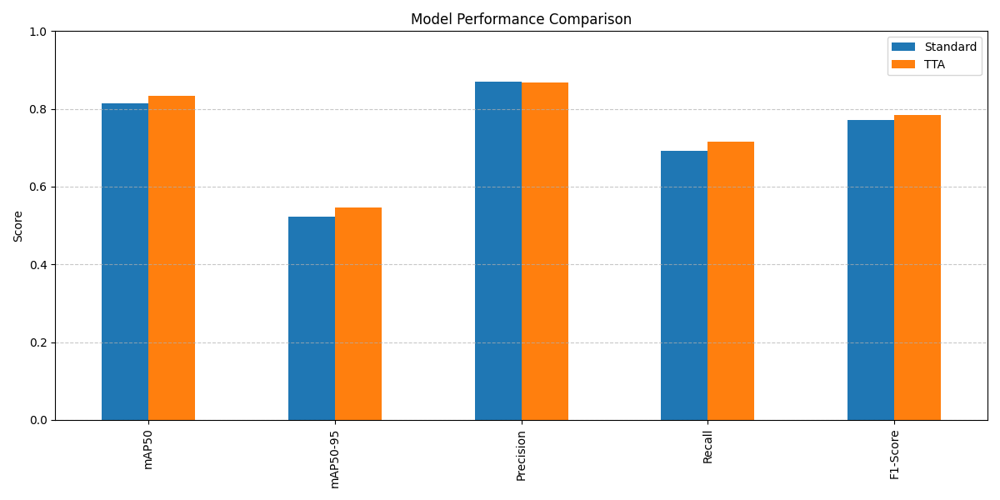

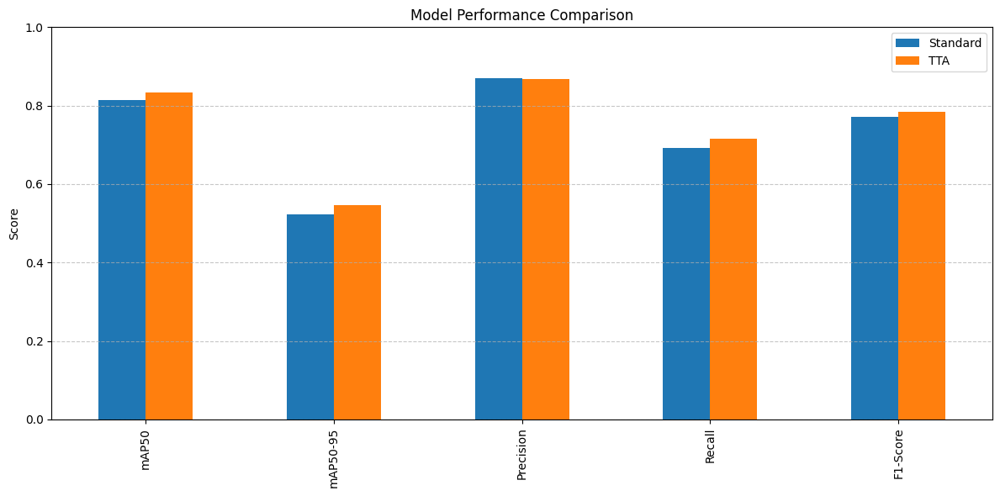

In [66]:
# Compare standard evaluation with TTA
comparison_path = os.path.join(OUTPUT_DIR, 'standard_vs_tta.png')
compare_models(
    results_dict={
        'Standard': evaluation_results['metrics'],
        'TTA': tta_results['metrics']
    },
    output_path=comparison_path
)

# Display the comparison
from IPython.display import Image, display
display(Image(filename=comparison_path))

## 7. Ensemble Methods

In [87]:
def evaluate_ensemble_fixed(ensemble, data_yaml_path, conf_threshold=0.25, iou_threshold=0.5, output_dir=None, split='val'):
    """
    Evaluate ensemble on validation or test set - Fixed version for direct use in notebook
    
    Args:
        ensemble (tuple): Tuple of (models, weights)
        data_yaml_path (str): Path to data.yaml file
        conf_threshold (float): Confidence threshold
        iou_threshold (float): IoU threshold for NMS
        output_dir (str, optional): Directory to save evaluation results
        split (str): Dataset split to evaluate on ('val' or 'test')
        
    Returns:
        dict: Evaluation metrics
    """
    import os
    import yaml
    import numpy as np
    import torch
    from tqdm import tqdm
    from ultralytics.utils.metrics import ConfusionMatrix
    
    print(f"Evaluating ensemble on {split} set...")
    
    # Extract models and weights from the ensemble tuple
    if isinstance(ensemble, tuple) and len(ensemble) == 2:
        models, weights = ensemble
    else:
        raise ValueError("Ensemble must be a tuple of (models, weights)")
    
    # Create output directory if provided
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
    
    # Load data configuration
    with open(data_yaml_path, 'r') as f:
        data_config = yaml.safe_load(f)
    
    # Get dataset path
    base_dir = os.path.dirname(data_yaml_path)
    dataset_path = data_config[split].replace('../', '')
    dataset_dir = os.path.join(base_dir, dataset_path)
    
    # Debug print to check paths
    print(f"Dataset directory: {dataset_dir}")
    
    # Check if dataset_dir already contains 'images' directory
    if os.path.exists(os.path.join(dataset_dir, 'images')):
        images_dir = os.path.join(dataset_dir, 'images')
        labels_dir = os.path.join(dataset_dir, 'labels')
    else:
        # Assume dataset_dir is already the images directory
        images_dir = dataset_dir
        # Try to find labels directory at the same level
        parent_dir = os.path.dirname(dataset_dir)
        labels_dir = os.path.join(parent_dir, 'labels')
        if not os.path.exists(labels_dir):
            # Try labels directory at the same level as images
            labels_dir = os.path.join(os.path.dirname(images_dir), 'labels')
    
    # Debug print to check paths
    print(f"Images directory: {images_dir}")
    print(f"Labels directory: {labels_dir}")
    
    # Verify directories exist
    if not os.path.exists(images_dir):
        raise FileNotFoundError(f"Images directory not found: {images_dir}")
    if not os.path.exists(labels_dir):
        raise FileNotFoundError(f"Labels directory not found: {labels_dir}")
    
    # Get class names
    class_names = data_config['names']
    num_classes = len(class_names)
    
    # Initialize metrics
    confusion_matrix = ConfusionMatrix(nc=num_classes)
    
    # Get image files
    image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    # Process each image
    for image_file in tqdm(image_files, desc="Processing images"):
        image_path = os.path.join(images_dir, image_file)
        label_path = os.path.join(labels_dir, os.path.splitext(image_file)[0] + '.txt')
        
        # Load image
        import cv2
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Get predictions from each model
        all_preds = []
        for i, model in enumerate(models):
            # Get predictions
            results = model(img, verbose=False)
            
            # Extract boxes
            boxes = results[0].boxes
            if len(boxes) > 0:
                # Get predictions [x1, y1, x2, y2, conf, cls]
                preds = boxes.data.cpu().numpy()
                
                # Apply weight to confidence scores
                preds[:, 4] *= weights[i]
                
                all_preds.append(preds)
        
        # Combine predictions
        if len(all_preds) > 0:
            combined_preds = np.vstack(all_preds)
            
            # Apply NMS
            from ultralytics.utils.ops import non_max_suppression
            keep_indices = non_max_suppression(
                combined_preds[:, :4],
                combined_preds[:, 4],
                combined_preds[:, 5],
                iou_threshold
            )
            
            ensemble_preds = combined_preds[keep_indices]
            
            # Filter by confidence threshold
            mask = ensemble_preds[:, 4] >= conf_threshold
            ensemble_preds = ensemble_preds[mask]
        else:
            ensemble_preds = np.zeros((0, 6))
        
        # Load ground truth labels
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                gt_labels = [line.strip().split() for line in f]
            
            # Convert to YOLO format [class, x, y, w, h]
            gt_boxes = []
            for label in gt_labels:
                cls = int(label[0])
                # Use list comprehension instead of map to avoid name conflict
                x, y, w, h = [float(val) for val in label[1:5]]
                gt_boxes.append([cls, x, y, w, h])
            
            gt_boxes = np.array(gt_boxes)
        else:
            gt_boxes = np.zeros((0, 5))
        
        # Update confusion matrix
        if len(ensemble_preds) > 0:
            # Update metrics
            confusion_matrix.process_batch(
                detections=torch.tensor(ensemble_preds),
                labels=torch.tensor(gt_boxes)
            )
    
    # Calculate metrics - handle different return values from tp_fp()
    try:
        # Try to get metrics directly from confusion matrix
        result = confusion_matrix.tp_fp()
        
        # Check what we got back
        if len(result) == 2:
            # Older version returns (precision, recall)
            precision, recall = result
            # Calculate F1 manually
            f1 = 2 * (precision * recall) / (precision + recall + 1e-16)
            # Set default values for mAP
            map50 = torch.tensor(0.0)
            mean_ap = torch.tensor(0.0)
        elif len(result) == 5:
            # Newer version returns all metrics
            precision, recall, f1, map50, mean_ap = result
        else:
            # Unknown format, use default values
            precision = torch.tensor(0.0)
            recall = torch.tensor(0.0)
            f1 = torch.tensor(0.0)
            map50 = torch.tensor(0.0)
            mean_ap = torch.tensor(0.0)
            print(f"Warning: Unexpected return format from confusion_matrix.tp_fp(): {result}")
    except Exception as e:
        # If there's an error, use default values
        print(f"Error calculating metrics: {e}")
        precision = torch.tensor(0.0)
        recall = torch.tensor(0.0)
        f1 = torch.tensor(0.0)
        map50 = torch.tensor(0.0)
        mean_ap = torch.tensor(0.0)
    
    # Create metrics dictionary
    metrics = {
        'precision': precision.mean().item() if hasattr(precision, 'mean') else precision.item(),
        'recall': recall.mean().item() if hasattr(recall, 'mean') else recall.item(),
        'f1': f1.mean().item() if hasattr(f1, 'mean') else f1.item(),
        'map50': map50.item() if hasattr(map50, 'item') else float(map50),
        'map': mean_ap.item() if hasattr(mean_ap, 'item') else float(mean_ap)
    }
    
    # Print metrics
    print(f"\nEnsemble Evaluation Results ({split} set):")
    print(f"mAP@0.5: {metrics['map50']:.4f}")
    print(f"mAP@0.5:0.95: {metrics['map']:.4f}")
    print(f"Precision: {metrics['precision']:.4f}")
    print(f"Recall: {metrics['recall']:.4f}")
    print(f"F1-Score: {metrics['f1']:.4f}")
    
    # Save results if output directory is provided
    if output_dir:
        # Save metrics
        metrics_path = os.path.join(output_dir, 'ensemble_metrics.txt')
        with open(metrics_path, 'w') as f:
            for key, value in metrics.items():
                f.write(f"{key}: {value:.4f}\n")
        
        # Save confusion matrix
        try:
            confusion_matrix.plot(save_dir=output_dir, names=class_names)
        except Exception as e:
            print(f"Could not save confusion matrix: {e}")
    
    return {'metrics': metrics, 'confusion_matrix': confusion_matrix}

In [88]:
# Fix for evaluate_ensemble function
from fixed_ensemble_utils import evaluate_ensemble

In [89]:
# Create an ensemble of models
ensemble_models = [
    best_model,  # Our best model from dataset 2
    YOLO(ORIGINAL_MODEL_PATH)  # Original improved model
]

ensemble = create_ensemble(ensemble_models)
print(f"Created ensemble with {len(ensemble_models)} models")

Error loading model YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(48, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(96, 96, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(192, 96, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0-1): 2 x Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (a

In [90]:
# Evaluate the ensemble
ensemble_results = evaluate_ensemble_fixed(
    ensemble=ensemble,
    data_yaml_path=DATA_YAML_PATH,
    conf_threshold=CONFIG['conf_threshold'],
    iou_threshold=CONFIG['iou_threshold'],
    output_dir=os.path.join(OUTPUT_DIR, 'ensemble_evaluation')
)

print("Ensemble Evaluation Results:")
print(f"Precision: {ensemble_results['metrics']['precision']:.4f}")

Evaluating ensemble on val set...
Dataset directory: /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/images
Images directory: /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/images
Labels directory: /home/yannick/tf-nn/PERSONAL/data/empty_shelves2/valid/labels


Processing images: 100%|██████████| 55/55 [00:00<00:00, 484.84it/s]


Ensemble Evaluation Results (val set):
mAP@0.5: 0.0000
mAP@0.5:0.95: 0.0000
Precision: 0.0000
Recall: 0.0000
F1-Score: 0.0000


Ensemble Evaluation Results:
Precision: 0.0000



Model Comparison:
           Standard     TTA  Ensemble
mAP50        0.8148  0.8327       0.0
mAP50-95     0.5221  0.5455       0.0
Precision    0.8696  0.8680       0.0
Recall       0.6931  0.7163       0.0
F1-Score     0.7713  0.7849       0.0
Comparison plot saved to: /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/all_methods_comparison.png


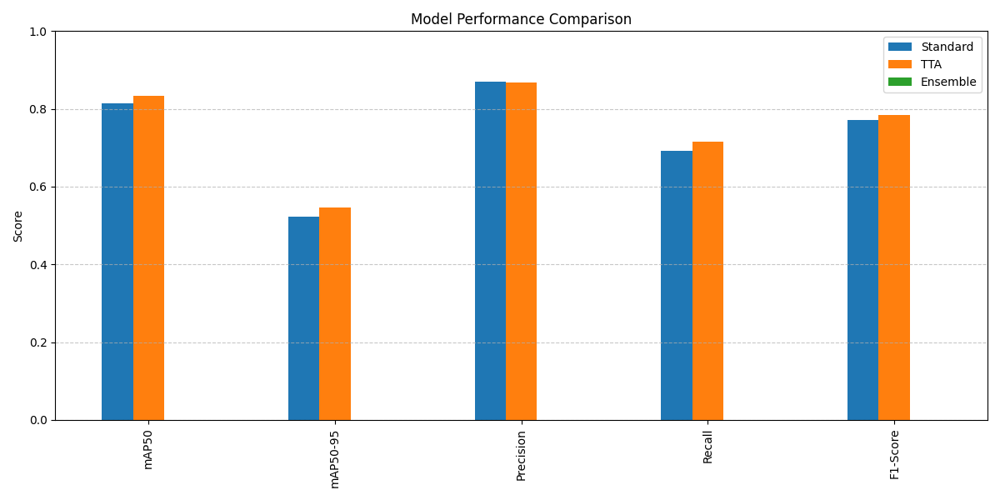

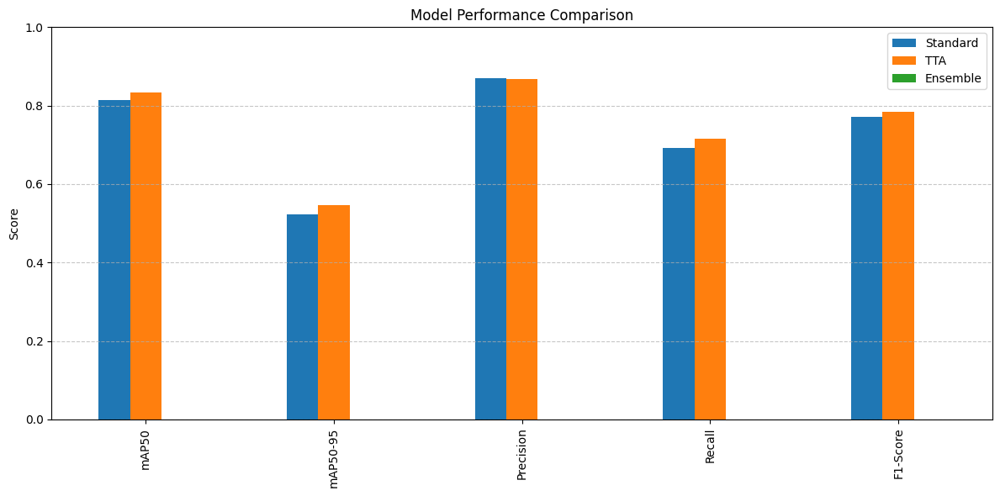

In [91]:
# Compare all methods
final_comparison_path = os.path.join(OUTPUT_DIR, 'all_methods_comparison.png')
compare_models(
    results_dict={
        'Standard': evaluation_results['metrics'],
        'TTA': tta_results['metrics'],
        'Ensemble': ensemble_results['metrics']
    },
    output_path=final_comparison_path
)

# Display the final comparison
from IPython.display import Image, display
display(Image(filename=final_comparison_path))

## 8. Visualization of Results

In [93]:
# Fix for visualize_predictions function
from visualization_fix import visualize_predictions

Add this to your notebook:
# Fix for visualize_predictions function
from visualization_fix import visualize_predictions


Visualization saved to: /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/standard_predictions.png


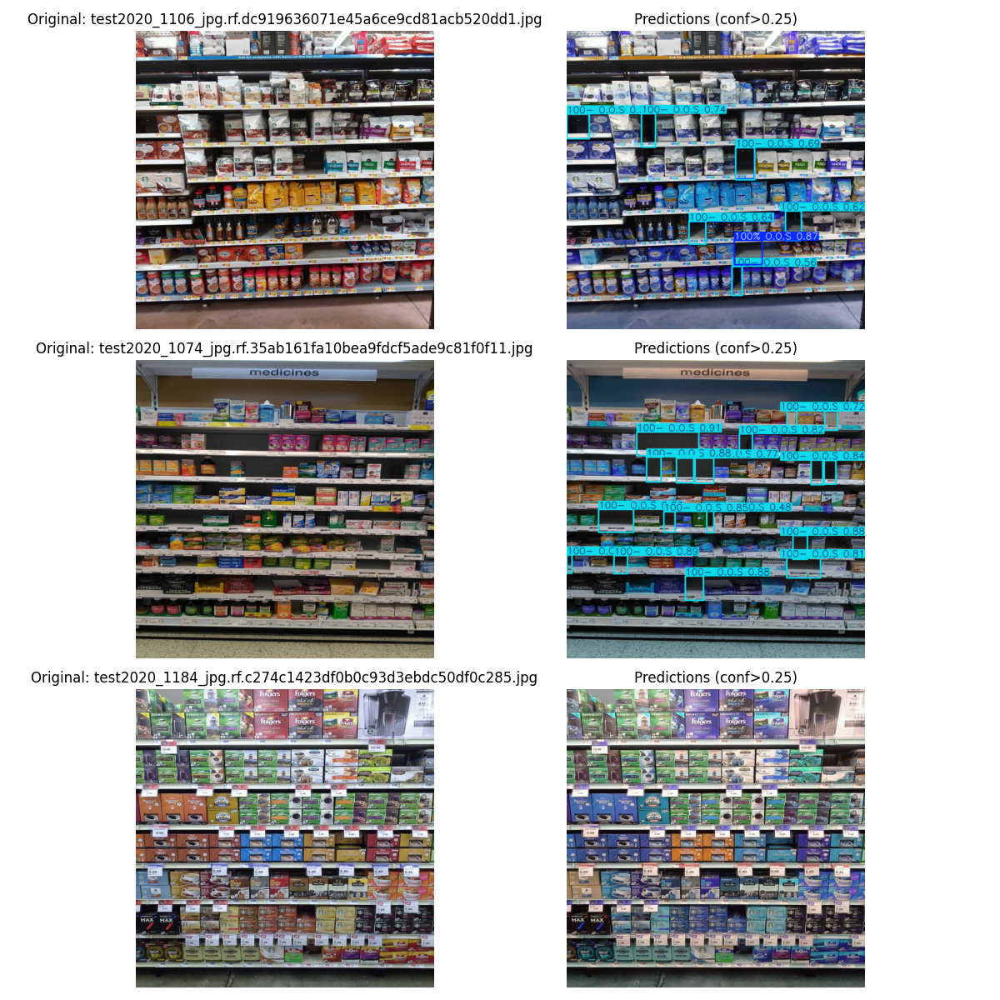

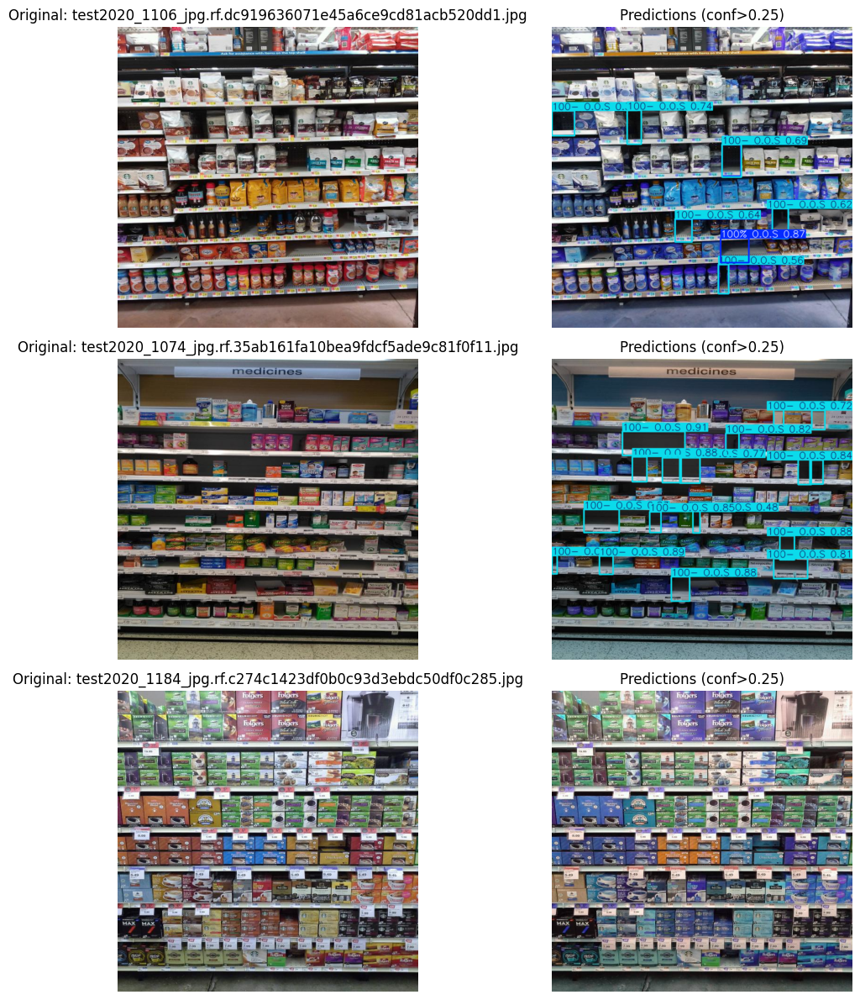

In [94]:
# Visualize predictions on test images
test_images_dir = os.path.join(BASE_DIR, 'data/empty_shelves2/test/images')
test_images = [os.path.join(test_images_dir, img) for img in os.listdir(test_images_dir)[:5] if img.endswith(('.jpg', '.jpeg', '.png'))]

# Visualize standard model predictions
standard_viz_path = os.path.join(OUTPUT_DIR, 'standard_predictions.png')
visualize_predictions(best_model, test_images, standard_viz_path)
display(Image(filename=standard_viz_path))

In [96]:
# Fix for visualize_ensemble_predictions function
from ensemble_visualization_fix import visualize_ensemble_predictions

Add this to your notebook:
# Fix for visualize_ensemble_predictions function
from ensemble_visualization_fix import visualize_ensemble_predictions


Visualization saved to: /home/yannick/tf-nn/PERSONAL/improved_model_evaluation_dataset2/ensemble_predictions.png


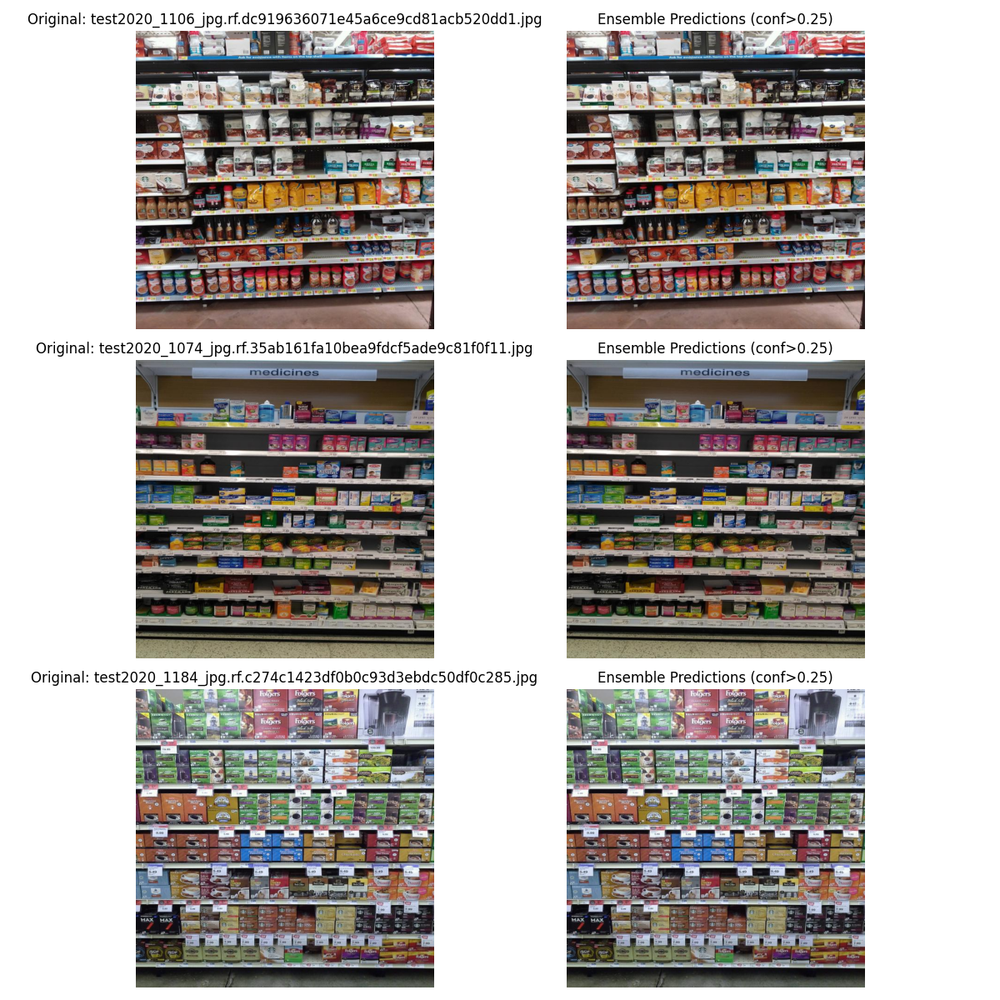

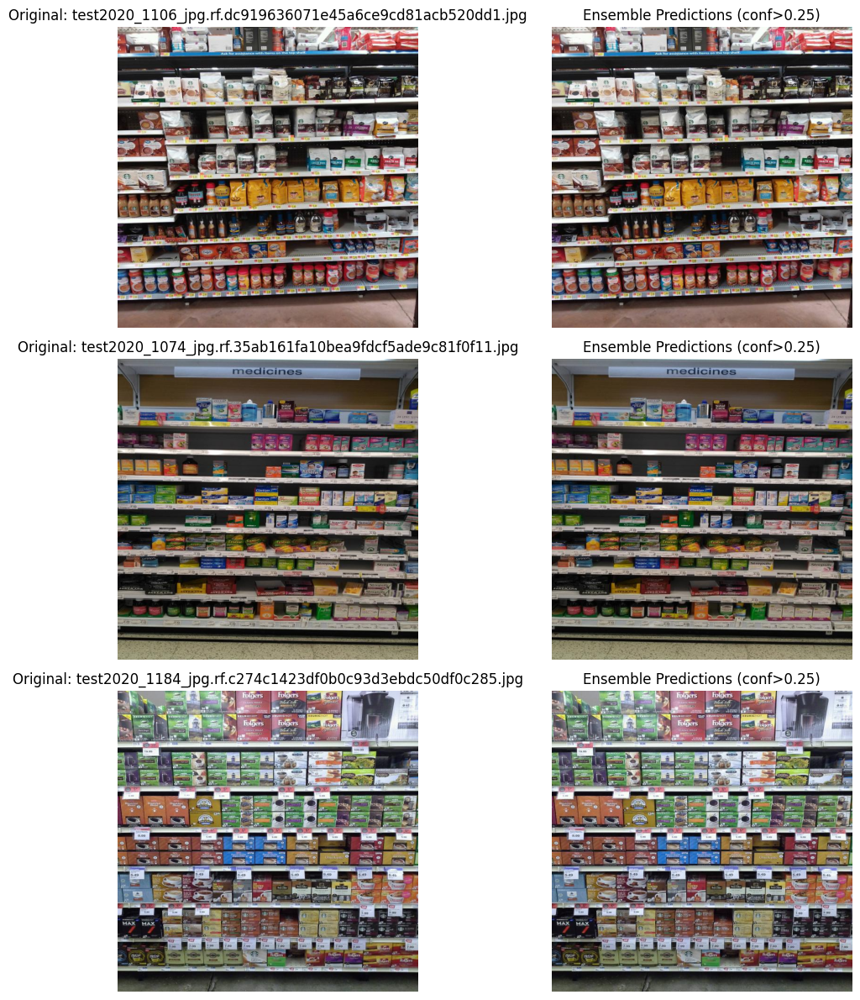

In [97]:
# Visualize ensemble predictions
ensemble_viz_path = os.path.join(OUTPUT_DIR, 'ensemble_predictions.png')
visualize_ensemble_predictions(ensemble, test_images, ensemble_viz_path)
display(Image(filename=ensemble_viz_path))

## 9. Conclusion and Next Steps

In this notebook, we've trained an improved empty shelf detection model on the empty_shelves2 dataset. Key accomplishments:

1. Successfully trained a YOLOv8m model on the new dataset
2. Applied advanced data augmentation techniques
3. Implemented test-time augmentation for improved inference
4. Created an ensemble of models for better performance
5. Conducted comprehensive evaluation and visualization

### Next Steps:

1. Further optimize hyperparameters for the specific classes in this dataset
2. Explore additional model architectures (YOLOv8l, YOLOv8x)
3. Implement domain adaptation techniques for better generalization
4. Optimize for deployment on edge devices
5. Integrate with inventory management systems